In [1]:
import matplotlib.pyplot as plt
import numpy as np

In [208]:
import readTrafficSigns as signs

images, labels = signs.readTrafficSigns("./GTSRB/Final_Training/Images")


In [213]:
print(images[88])

[[[ 86 102 100]
  [ 91  81  92]
  [192 155 189]
  ...
  [ 88  84  94]
  [100  95 109]
  [131 125 125]]

 [[ 54  62  33]
  [125 118  64]
  [198 174 188]
  ...
  [ 78  63  83]
  [108  93  75]
  [140 124 102]]

 [[ 98  99  73]
  [103  98  83]
  [117 106 111]
  ...
  [ 97  70  93]
  [ 97  71  77]
  [147 121 114]]

 ...

 [[ 30  29  29]
  [ 31  29  28]
  [ 39  36  38]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 35  32  32]
  [ 36  34  34]
  [ 39  37  39]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[ 44  41  40]
  [ 37  35  37]
  [ 32  30  32]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]


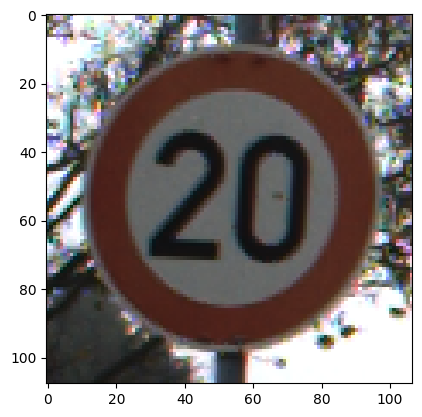

In [212]:
plt.imshow(images[88])
plt.show()


In [2]:
import numpy as np
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import csv
import os
from tqdm import tqdm

## Need Cleanup Dataset

In [3]:
train_path = './GTSRB/Final_Training/Images'
test_path = './GTSRB/Final_Test/Images'

In [4]:
# Funktion zum Laden der GTSRB-Daten
def readTrafficSigns(rootpath):
    '''Reads traffic sign data for German Traffic Sign Recognition Benchmark.
    Arguments: path to the traffic sign data, for example './GTSRB/Training'
    Returns: list of images, list of corresponding labels, list of image shapes, list of ROI, list of image paths'''
    images = []  # images
    labels = []  # corresponding labels
    image_shapes = []  # dimensions of images
    rois = []  # Regions of Interest (ROI) for each image
    image_paths = []  # paths to images
    # loop over all 43 classes
    for c in range(0, 43):
        prefix = rootpath + '/' + format(c, '05d') + '/'  # subdirectory for class
        gtFile = open(prefix + 'GT-' + format(c, '05d') + '.csv')  # annotations file
        gtReader = csv.reader(gtFile, delimiter=';')  # csv parser for annotations file
        next(gtReader)  # skip header
        # loop over all images in current annotations file
        for row in gtReader:
            img_path = prefix + row[0]
            img = plt.imread(img_path)  # load image
            images.append(img)
            labels.append(int(row[7]))  # the 8th column is the label
            image_shapes.append(img.shape)
            rois.append((int(row[3]), int(row[4]), int(row[5]), int(row[6])))  # ROI coordinates
            image_paths.append(img_path)
        gtFile.close()
    return images, labels, image_shapes, rois, image_paths

In [5]:
# Funktion zum Laden der GTSRB-Daten
def readTrafficSignsDf(rootpath):
    '''Reads traffic sign data for German Traffic Sign Recognition Benchmark.
    Arguments: path to the traffic sign data, for example './GTSRB/Training'
    Returns: list of images, list of corresponding labels, list of image shapes, list of ROI, list of image paths'''
    images = []  # images
    labels = []  # corresponding labels
    image_shapes = []  # dimensions of images
    rois = []  # Regions of Interest (ROI) for each image
    image_paths = []  # paths to images
    # loop over all 43 classes
    for c in range(0, 43):
        prefix = rootpath + '/' + format(c, '05d') + '/'  # subdirectory for class
        gtFile = open(prefix + 'GT-' + format(c, '05d') + '.csv')  # annotations file
        gtReader = csv.reader(gtFile, delimiter=';')  # csv parser for annotations file
        next(gtReader)  # skip header
        # loop over all images in current annotations file
        for row in gtReader:
            img_path = prefix + row[0]
            img = plt.imread(img_path)  # load image
            images.append(img)
            labels.append(int(row[7]))  # the 8th column is the label
            image_shapes.append(img.shape)
            rois.append((int(row[3]), int(row[4]), int(row[5]), int(row[6])))  # ROI coordinates
            image_paths.append(img_path)
        gtFile.close()
    # Erstelle ein DataFrame
    data = {
        'Image': images,
        'Label': labels,
        'Shape': image_shapes,
        'ROI': rois,
        'ImagePath': image_paths
    }
    
    df_final_tain = pd.DataFrame(data)
    return df_final_tain

In [4]:
def read_final_test(rootpath):
    '''Reads the final test data for the German Traffic Sign Recognition Benchmark.
    Arguments: path to the final test data, for example './GTSRB/Final_Test/Images'
    Returns: DataFrame with image data, labels, image shapes, and ROI
    '''
    # Pfad zur CSV-Datei
    csv_file = os.path.join(rootpath, 'GT-final_test_gt.csv')
    
    # Lade die CSV-Datei
    df = pd.read_csv(csv_file, delimiter=';')
    
    # Listen zum Speichern der Daten
    images = []
    labels = []
    image_shapes = []
    rois = []
    image_paths = []
    
    # Schleife über alle Zeilen der CSV-Datei
    for _, row in tqdm(df.iterrows(), total=df.shape[0]):
        img_path = os.path.join(rootpath, row['Filename'])
        img = cv2.imread(img_path)  # Lade das Bild
        
        if img is not None:
            images.append(img)
            labels.append(int(row['ClassId']))
            image_shapes.append(img.shape)
            rois.append((int(row['Roi.X1']), int(row['Roi.Y1']), int(row['Roi.X2']), int(row['Roi.Y2'])))
            image_paths.append(img_path)
        else:
            print(f"Bild {img_path} konnte nicht geladen werden.")
    
    # Erstelle ein DataFrame
    data = {
        'Image': images,
        'Label': labels,
        'Shape': image_shapes,
        'ROI': rois,
        'ImagePath': image_paths
    }
    
    df_final_test = pd.DataFrame(data)
    return df_final_test

In [6]:
def readTrafficSignsTest(rootpath):
    '''Reads the final test data for the German Traffic Sign Recognition Benchmark.
    Arguments: path to the final test data, for example './GTSRB/Final_Test/Images'
    Returns: DataFrame with image data, labels, image shapes, and ROI
    '''
    # Pfad zur CSV-Datei
    csv_file = os.path.join(rootpath, 'GT-final_test_gt.csv')
    
    # Lade die CSV-Datei
    df = pd.read_csv(csv_file, delimiter=';')
    
    # Liste zum Speichern der Daten
    data = []
    
    # Schleife über alle Zeilen der CSV-Datei
    for _, row in df.iterrows():
        img_path = os.path.join(rootpath, row['Filename'])
        img = plt.imread(img_path)  # Lade das Bild
        
        if img is not None:
            label = int(row['ClassId'])
            height, width, channels = img.shape
            roi_x1 = int(row['Roi.X1'])
            roi_y1 = int(row['Roi.Y1'])
            roi_x2 = int(row['Roi.X2'])
            roi_y2 = int(row['Roi.Y2'])
            
            # Füge die Daten als Zeile hinzu
            data.append([width, height, roi_x1, roi_y1, roi_x2, roi_y2, img_path, label])
        else:
            print(f"Bild {img_path} konnte nicht geladen werden.")
    
    # Erstelle ein DataFrame aus der Liste
    df_test = pd.DataFrame(data, columns=['Width', 'Height','Roi.X1', 'Roi.Y1', 'Roi.X2', 'Roi.Y2', 'Path', 'Label'])
    return df_test

In [5]:
df_test = read_final_test(test_path)

print(df_test.head())

100%|██████████| 12630/12630 [00:02<00:00, 4344.18it/s]


                                               Image  Label        Shape  \
0  [[[173, 138, 115], [172, 138, 116], [169, 137,...     16  (54, 53, 3)   
1  [[[61, 69, 55], [65, 82, 82], [61, 78, 91], [6...      1  (45, 42, 3)   
2  [[[36, 38, 50], [38, 39, 50], [37, 38, 49], [3...     38  (52, 48, 3)   
3  [[[87, 125, 132], [52, 82, 90], [23, 67, 77], ...     33  (29, 27, 3)   
4  [[[31, 35, 38], [31, 35, 38], [32, 37, 41], [3...     11  (57, 60, 3)   

              ROI                            ImagePath  
0  (6, 5, 48, 49)  ./GTSRB/Final_Test/Images\00000.ppm  
1  (5, 5, 36, 40)  ./GTSRB/Final_Test/Images\00001.ppm  
2  (6, 6, 43, 47)  ./GTSRB/Final_Test/Images\00002.ppm  
3  (5, 5, 22, 24)  ./GTSRB/Final_Test/Images\00003.ppm  
4  (5, 5, 55, 52)  ./GTSRB/Final_Test/Images\00004.ppm  


In [13]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12630 entries, 0 to 12629
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Image      12630 non-null  object
 1   Label      12630 non-null  int64 
 2   Shape      12630 non-null  object
 3   ROI        12630 non-null  object
 4   ImagePath  12630 non-null  object
dtypes: int64(1), object(4)
memory usage: 493.5+ KB


In [11]:
# Laden der Daten
images, labels, image_shapes, rois, image_paths  = readTrafficSigns(train_path)

# Anzeigen der Form der Daten
print(f"Number of images: {len(images)}")
print(f"Number of labels: {len(labels)}")
print(f"Number of image shapes: {len(image_shapes)}")
print(f"Number of ROIs: {len(rois)}")
print(f"Number of image paths: {len(image_paths)}")

Number of images: 39209
Number of labels: 39209
Number of image shapes: 39209
Number of ROIs: 39209
Number of image paths: 39209


In [14]:
# Erstelle ein DataFrame
data = {
    'Image': images,
    'Label': labels,
    'Shape': image_shapes,
    'ROI': rois,
    'ImagePath': image_paths
}

df_train = pd.DataFrame(data)

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39209 entries, 0 to 39208
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Image      39209 non-null  object
 1   Label      39209 non-null  int64 
 2   Shape      39209 non-null  object
 3   ROI        39209 non-null  object
 4   ImagePath  39209 non-null  object
dtypes: int64(1), object(4)
memory usage: 1.5+ MB


In [7]:
df_test_raw = readTrafficSignsTest(test_path)

In [8]:
def adjust_class_ids(df):
    id_mapping = {1: 1, 2: 2, 12: 3, 14: 4, 17: 5, 41: 6}
    
    df['Label'] = df['Label'].map(id_mapping)
    df = df.dropna(subset=['Label'])
    
    return df

In [9]:
df_test_short = adjust_class_ids(df_test)

In [18]:
df_train.head()

,Image,Label,Shape,ROI,ImagePath
0,"[[[75, 78, 80], [74, 76, 78], [86, 87, 84], [1...",0,"(30, 29, 3)","(5, 6, 24, 25)",./GTSRB/Final_Training/Images/00000/00000_0000...
1,"[[[69, 73, 73], [76, 79, 79], [75, 77, 77], [7...",0,"(30, 30, 3)","(5, 5, 25, 25)",./GTSRB/Final_Training/Images/00000/00000_0000...
2,"[[[72, 72, 72], [79, 79, 79], [78, 78, 73], [1...",0,"(30, 30, 3)","(5, 5, 25, 25)",./GTSRB/Final_Training/Images/00000/00000_0000...
3,"[[[68, 67, 67], [76, 72, 73], [90, 82, 82], [1...",0,"(31, 31, 3)","(5, 5, 26, 26)",./GTSRB/Final_Training/Images/00000/00000_0000...
4,"[[[73, 73, 75], [74, 73, 75], [75, 72, 69], [1...",0,"(32, 30, 3)","(5, 6, 25, 26)",./GTSRB/Final_Training/Images/00000/00000_0000...


In [10]:
# Label Overview
classes = { 0:'Speed limit (20km/h)',
            1:'Speed limit (30km/h)', 
            2:'Speed limit (50km/h)', 
            3:'Speed limit (60km/h)', 
            4:'Speed limit (70km/h)', 
            5:'Speed limit (80km/h)', 
            6:'End of speed limit (80km/h)', 
            7:'Speed limit (100km/h)', 
            8:'Speed limit (120km/h)', 
            9:'No passing', 
            10:'No passing veh over 3.5 tons', 
            11:'Right-of-way at intersection', 
            12:'Priority road', 
            13:'Yield', 
            14:'Stop', 
            15:'No vehicles', 
            16:'Veh > 3.5 tons prohibited', 
            17:'No entry', 
            18:'General caution', 
            19:'Dangerous curve left', 
            20:'Dangerous curve right', 
            21:'Double curve', 
            22:'Bumpy road', 
            23:'Slippery road', 
            24:'Road narrows on the right', 
            25:'Road work', 
            26:'Traffic signals', 
            27:'Pedestrians', 
            28:'Children crossing', 
            29:'Bicycles crossing', 
            30:'Beware of ice/snow',
            31:'Wild animals crossing', 
            32:'End speed + passing limits', 
            33:'Turn right ahead', 
            34:'Turn left ahead', 
            35:'Ahead only', 
            36:'Go straight or right', 
            37:'Go straight or left', 
            38:'Keep right', 
            39:'Keep left', 
            40:'Roundabout mandatory', 
            41:'End of no passing', 
            42:'End no passing veh > 3.5 tons' }

## Dataset

In [6]:
def readTrafficSignsTrain(rootpath, cache_path):
    '''Reads traffic sign data for German Traffic Sign Recognition Benchmark.
    Arguments:
        rootpath: path to the traffic sign data, for example './GTSRB/Training'
        cache_path: path to the cached DataFrame file, default is 'traffic_signs_data.pkl'
    Returns:
        DataFrame containing labels, image shapes, ROIs, and image paths
    '''
    
    if os.path.exists(cache_path):
        print(f"Loading: {cache_path}")
        return pd.read_pickle(cache_path)

    data = []
    # loop over all 43 classes
    for c in range(0, 43):
        prefix = f"{rootpath}/{c:05d}/"  # subdirectory for class
        gtFile = open(prefix + f'GT-{c:05d}.csv')  # annotations file
        gtReader = csv.reader(gtFile, delimiter=';')  # csv parser for annotations file
        next(gtReader)  # skip header

        # loop over all images in current annotations file
        for row in gtReader:
            img_path = prefix + row[0]
            img = plt.imread(img_path)  # load image
 
            label = int(row[7])  # the 8th column is the label
            height = img.shape[0]  # height of the image
            width = img.shape[1]  # width of the image
            #channels = img.shape[2] if len(img.shape) > 2 else 1  # channels of the image (default to 1 if grayscale)
            roi_x1 = int(row[3])  # ROI X1 coordinate
            roi_y1 = int(row[4])  # ROI Y1 coordinate
            roi_x2 = int(row[5])  # ROI X2 coordinate
            roi_y2 = int(row[6])  # ROI Y2 coordinate

            data.append([width, height, roi_x1, roi_y1, roi_x2, roi_y2, img_path, label])

        gtFile.close()

    df = pd.DataFrame(data, columns=['Width', 'Height','Roi.X1', 'Roi.Y1', 'Roi.X2', 'Roi.Y2', 'Path', 'Label'])
    
    df.to_pickle(cache_path)
    print(f"Dataframe saved in: {cache_path}")
    
    return df

In [7]:
def readTrafficSignsTest(rootpath, cache_path):
    '''Reads the final test data for the German Traffic Sign Recognition Benchmark.
    Arguments: path to the final test data, for example './GTSRB/Final_Test/Images'
    Returns: DataFrame with image data, labels, image shapes, and ROI
    '''
    
    if os.path.exists(cache_path):
        print(f"Loading: {cache_path}")
        return pd.read_pickle(cache_path)

    # Pfad zur CSV-Datei
    csv_file = os.path.join(rootpath, 'GT-final_test_gt.csv')
    
    # Lade die CSV-Datei
    df = pd.read_csv(csv_file, delimiter=';')
    
    # Liste zum Speichern der Daten
    data = []
    
    # Schleife über alle Zeilen der CSV-Datei
    for _, row in df.iterrows():
        img_path = os.path.join(rootpath, row['Filename'])
        img = plt.imread(img_path)  # Lade das Bild
        
        if img is not None:
            label = int(row['ClassId'])
            height, width, channels = img.shape
            roi_x1 = int(row['Roi.X1'])
            roi_y1 = int(row['Roi.Y1'])
            roi_x2 = int(row['Roi.X2'])
            roi_y2 = int(row['Roi.Y2'])
            
            # Füge die Daten als Zeile hinzu
            data.append([width, height, roi_x1, roi_y1, roi_x2, roi_y2, img_path, label])
        else:
            print(f"Bild {img_path} konnte nicht geladen werden.")
    
    # Erstelle ein DataFrame aus der Liste
    df_test = pd.DataFrame(data, columns=['Width', 'Height','Roi.X1', 'Roi.Y1', 'Roi.X2', 'Roi.Y2', 'Path', 'Label'])
    df_test.to_pickle(cache_path)
    print(f"Dataframe saved in: {cache_path}")
    return df_test

In [8]:
def reassign_labels(df, selected_labels, unknown_label, sample_size):
    """
    Reassign labels in the dataframe according to selected_labels.
    Keep all rows for the labels in selected_labels.
    For remaining labels, sample a specified number of rows and reassign them to unknown_label.

    Parameters:
    df (pd.DataFrame): The input dataframe with a column named 'Label'.
    selected_labels (dict): A dictionary mapping old labels to new labels.
    unknown_label (int): The label to assign to the remaining sampled rows.
    sample_size (int): The number of rows to sample for each remaining label. Default is 15.

    Returns:
    pd.DataFrame: A new dataframe with reassigned labels.
    """
    new_df = pd.DataFrame()

    for old_label, new_label in selected_labels.items():
        label_df = df[df['Label'] == old_label].copy()
        label_df['Label'] = new_label
        new_df = pd.concat([new_df, label_df])

    unique_labels = df['Label'].unique()
    remaining_labels = [label for label in unique_labels if label not in selected_labels]

    for label in remaining_labels:
        label_df = df[df['Label'] == label]
        if len(label_df) > sample_size:
            selected_rows = label_df.sample(n=sample_size, random_state=42)
        else:
            selected_rows = label_df
        selected_rows['Label'] = unknown_label
        new_df = pd.concat([new_df, selected_rows])

    new_df.reset_index(drop=True, inplace=True)

    return new_df

In [72]:
classes = { 0: 'Geschwindigkeitsbegrenzung (20km/h)',
            1: 'Geschwindigkeitsbegrenzung (30km/h)', 
            2: 'Geschwindigkeitsbegrenzung (50km/h)', 
            3: 'Geschwindigkeitsbegrenzung (60km/h)', 
            4: 'Geschwindigkeitsbegrenzung (70km/h)', 
            5: 'Geschwindigkeitsbegrenzung (80km/h)', 
            6: 'Ende der Geschwindigkeitsbegrenzung (80km/h)', 
            7: 'Geschwindigkeitsbegrenzung (100km/h)', 
            8: 'Geschwindigkeitsbegrenzung (120km/h)', 
            9: 'Überholverbot', 
            10: 'Überholverbot für Fahrzeuge über 3.5 Tonnen', 
            11: 'Vorfahrt an der nächsten Kreuzung', 
            12: 'Vorrangstraße', 
            13: 'Vorfahrt gewähren', 
            14: 'Stop', 
            15: 'Verbot für Fahrzeuge aller Art', 
            16: 'Verbot für Fahrzeuge über 3.5 Tonnen', 
            17: 'Einfahrt verboten', 
            18: 'Allgemeine Gefahr', 
            19: 'Gefährliche Kurve nach links', 
            20: 'Gefährliche Kurve nach rechts', 
            21: 'Doppelkurve', 
            22: 'Unebene Fahrbahn', 
            23: 'Schleudergefahr', 
            24: 'Fahrbahnverengung von rechts', 
            25: 'Straßenbauarbeiten', 
            26: 'Ampel', 
            27: 'Fußgänger', 
            28: 'Kinder', 
            29: 'Radfahrer', 
            30: 'Achtung, Schnee oder Eisglätte', 
            31: 'Wildwechsel', 
            32: 'Ende der Geschwindigkeitsbegrenzungen und Überholverbote', 
            33: 'Rechts abbiegen', 
            34: 'Links abbiegen', 
            35: 'Geradeaus', 
            36: 'Geradeaus oder rechts', 
            37: 'Geradeaus oder links', 
            38: 'Rechts halten', 
            39: 'Links halten', 
            40: 'Kreisverkehr', 
            41: 'Ende des Überholverbots', 
            42: 'Ende des Überholverbots für Fahrzeuge > 3.5 Tonnen' }

In [21]:
short_classes = { 1: 'Geschwindigkeitsbegrenzung (30km/h)', 
                  2: 'Geschwindigkeitsbegrenzung (50km/h)', 
                  3: 'Vorrangstraße', 
                  4: 'Stop', 
                  5: 'Einfahrt verboten', 
                  6: 'Ende des Überholverbots'}

In [30]:
from PIL import Image

In [25]:
def load_image_into_numpy_array(path):
    image = Image.open(path)
    image = image.resize((280, 280))  # Resize to 280x280
    return np.array(image).astype(np.uint8)

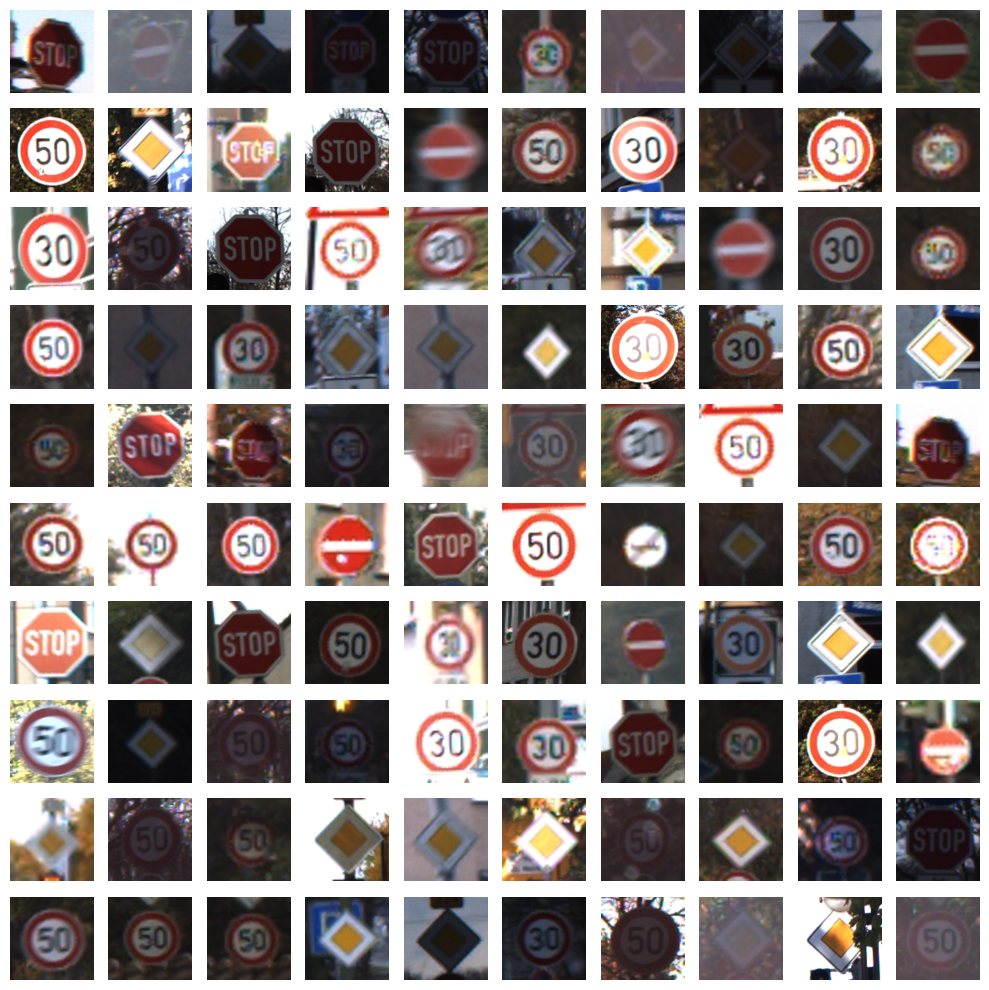

In [31]:
image_paths_to_display = df_test_short['ImagePath'].tolist()
image_paths_to_display = random.sample(image_paths_to_display, min(len(image_paths_to_display), 100))

plt.figure(figsize=(10, 10))
for i, image_path in enumerate(image_paths_to_display):
    image_np = load_image_into_numpy_array(image_path)  # Funktion, um Bild in ein numpy array zu laden
    plt.subplot(10, 10, i + 1)
    plt.imshow(image_np)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [22]:
# Verteilung der Labels
# Verteilung der Labels
#label_counts_train = df_train['Label'].value_counts().sort_index()
label_counts_test = df_test_short['Label'].value_counts().sort_index()
num_classes = len(label_counts_test)

C:\Users\Alexej\AppData\Local\Temp\ipykernel_17836\1617870200.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(label_counts_named_train.keys()), y=list(label_counts_named_train.values()), palette='viridis')


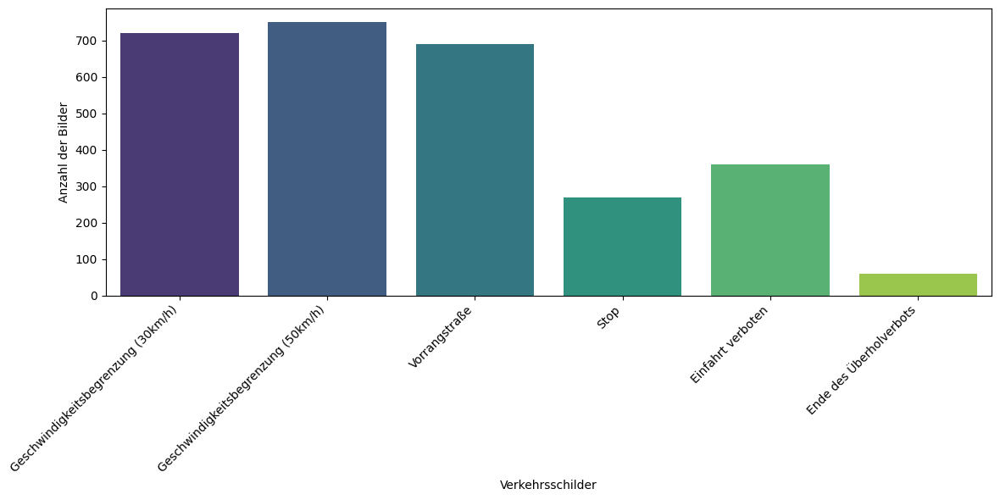

In [24]:
# Konvertiere die IDs der label_counts entsprechend den ausgeschriebenen Klassen
label_counts_named_train = {short_classes[key]: value for key, value in label_counts_test.items()}

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=list(label_counts_named_train.keys()), y=list(label_counts_named_train.values()), palette='viridis')
plt.xlabel('Verkehrsschilder')
plt.ylabel('Anzahl der Bilder')
#plt.title('Verteilung der Verkehrsschilder im Trainingsdatensatz von insgesamt '+str(len(labels))+' Bilder')
plt.xticks(rotation=45, ha='right')  # Optional: Rotiere die Beschriftungen für bessere Lesbarkeit
plt.tight_layout()
plt.show()

C:\Users\Alexej\AppData\Local\Temp\ipykernel_1360\847149808.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(label_counts_sorted_train.keys()), y=list(label_counts_sorted_train.values()), palette='viridis')


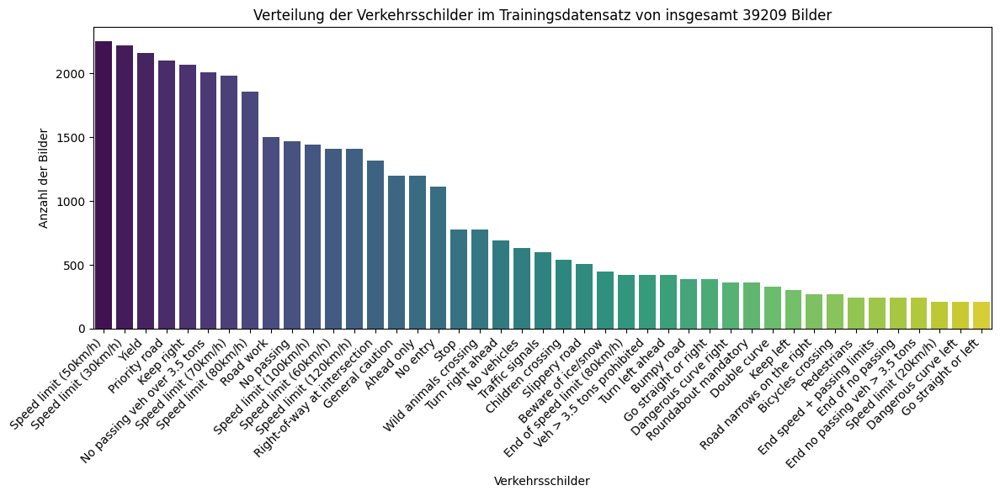

In [44]:
# Konvertiere die IDs der label_counts entsprechend den ausgeschriebenen Klassen
label_counts_sorted_train = dict(sorted(label_counts_named_train.items(), key=lambda item: item[1], reverse=True))
# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=list(label_counts_sorted_train.keys()), y=list(label_counts_sorted_train.values()), palette='viridis')
plt.xlabel('Verkehrsschilder')
plt.ylabel('Anzahl der Bilder')
plt.title('Verteilung der Verkehrsschilder im Trainingsdatensatz von insgesamt '+str(len(labels))+' Bilder')
plt.xticks(rotation=45, ha='right')  # Optional: Rotiere die Beschriftungen für bessere Lesbarkeit
plt.tight_layout()
plt.show()

C:\Users\Alexej\AppData\Local\Temp\ipykernel_1360\3814364118.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(label_counts_named_test.keys()), y=list(label_counts_named_test.values()), palette='viridis')


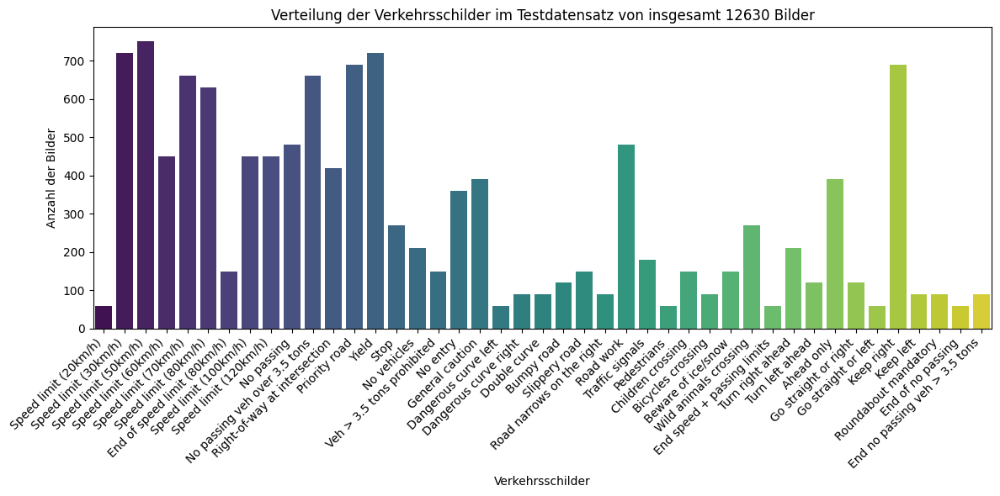

In [45]:
# Konvertiere die IDs der label_counts entsprechend den ausgeschriebenen Klassen
label_counts_named_test = {classes[key]: value for key, value in label_counts_test.items()}

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=list(label_counts_named_test.keys()), y=list(label_counts_named_test.values()), palette='viridis')
plt.xlabel('Verkehrsschilder')
plt.ylabel('Anzahl der Bilder')
plt.title('Verteilung der Verkehrsschilder im Testdatensatz von insgesamt '+str(len(df_test['Label']))+' Bilder')
plt.xticks(rotation=45, ha='right')  # Optional: Rotiere die Beschriftungen für bessere Lesbarkeit
plt.tight_layout()
plt.show()

C:\Users\Alexej\AppData\Local\Temp\ipykernel_1360\2365769860.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(label_counts_sorted_test.keys()), y=list(label_counts_sorted_test.values()), palette='viridis')


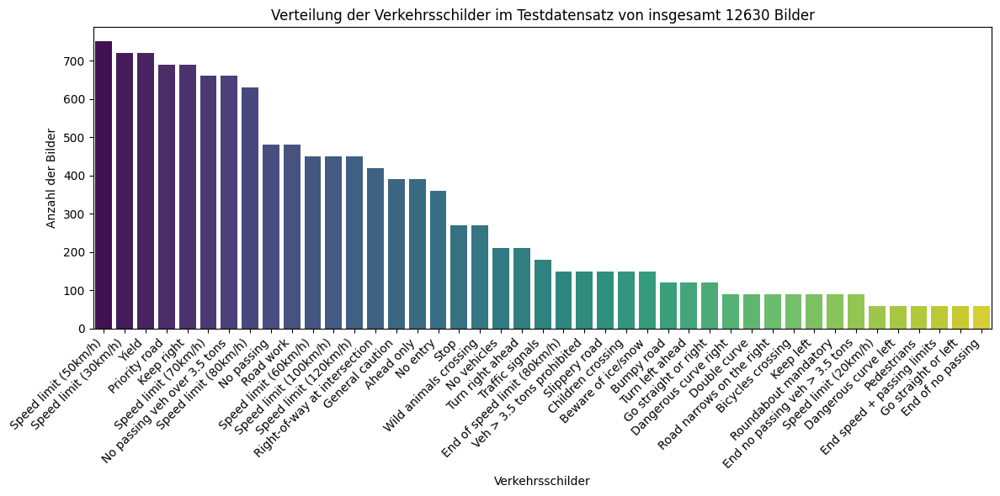

In [47]:
# Konvertiere die IDs der label_counts entsprechend den ausgeschriebenen Klassen
label_counts_sorted_test = dict(sorted(label_counts_named_test.items(), key=lambda item: item[1], reverse=True))
# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=list(label_counts_sorted_test.keys()), y=list(label_counts_sorted_test.values()), palette='viridis')
plt.xlabel('Verkehrsschilder')
plt.ylabel('Anzahl der Bilder')
plt.title('Verteilung der Verkehrsschilder im Testdatensatz von insgesamt '+str(len(df_test['Label']))+' Bilder')
plt.xticks(rotation=45, ha='right')  # Optional: Rotiere die Beschriftungen für bessere Lesbarkeit
plt.tight_layout()
plt.show()

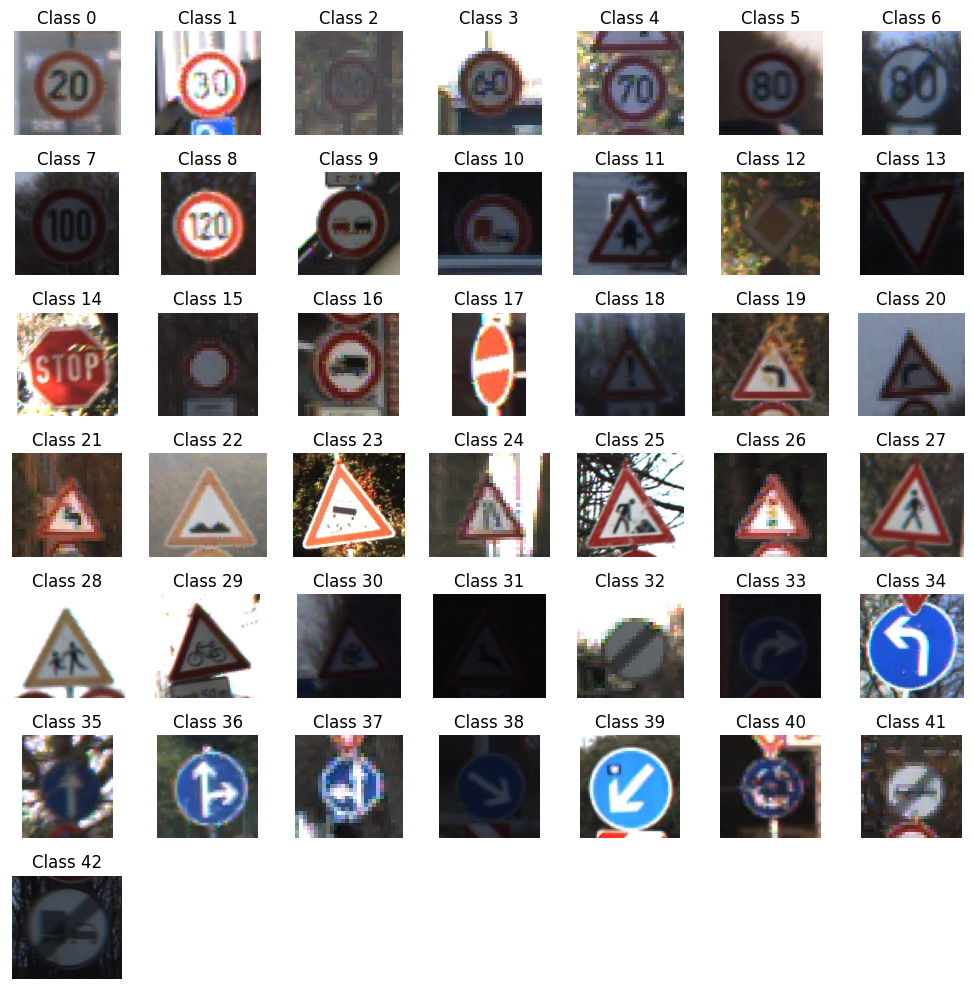

In [19]:
# Beispielbilder jeder Klasse anzeigen
plt.figure(figsize=(10, 10))
for class_id in range(num_classes):
    idxs = np.where(np.array(labels) == class_id)[0]
    idx = np.random.choice(idxs)
    plt.subplot(7, 7, class_id + 1)
    plt.imshow(images[idx])
    plt.axis('off')
    plt.title(f'Class {class_id}')
plt.tight_layout()
plt.show()

In [32]:
df_train.describe()

,Label
count,39209.000000
mean,15.788390
std,12.013238
min,0.000000
25%,5.000000
50%,12.000000
75%,25.000000
max,42.000000


In [69]:
# Statistiken zu Bildgrößen
train_image_shapes = df_train['Shape'].tolist()
test_image_shapes = df_test['Shape'].tolist()

df_train_shapes = pd.DataFrame(train_image_shapes, columns=['Height', 'Width', 'Channels'])
df_test_shapes = pd.DataFrame(test_image_shapes, columns=['Height', 'Width', 'Channels'])

print(df_train_shapes.describe())
print(df_test_shapes.describe())

             Height         Width  Channels
count  39209.000000  39209.000000   39209.0
mean      50.328930     50.835880       3.0
std       23.115423     24.306933       0.0
min       25.000000     25.000000       3.0
25%       35.000000     35.000000       3.0
50%       43.000000     43.000000       3.0
75%       58.000000     58.000000       3.0
max      225.000000    243.000000       3.0
             Height         Width  Channels
count  12630.000000  12630.000000   12630.0
mean      50.364450     50.507759       3.0
std       23.698908     25.088483       0.0
min       25.000000     25.000000       3.0
25%       35.000000     34.000000       3.0
50%       43.000000     43.000000       3.0
75%       57.000000     58.000000       3.0
max      232.000000    266.000000       3.0


In [73]:
# Daten vorbereiten: Klassen-ID und Höhe, Breite der Bilder
data = pd.DataFrame({
    'class': df_train['Label'], 
    'Height': df_train_shapes['Height'],
    'Width': df_train_shapes['Width']
})

C:\Users\Alexej\AppData\Local\Temp\ipykernel_1360\1712989698.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='class', y='Height', data=data, palette='viridis')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


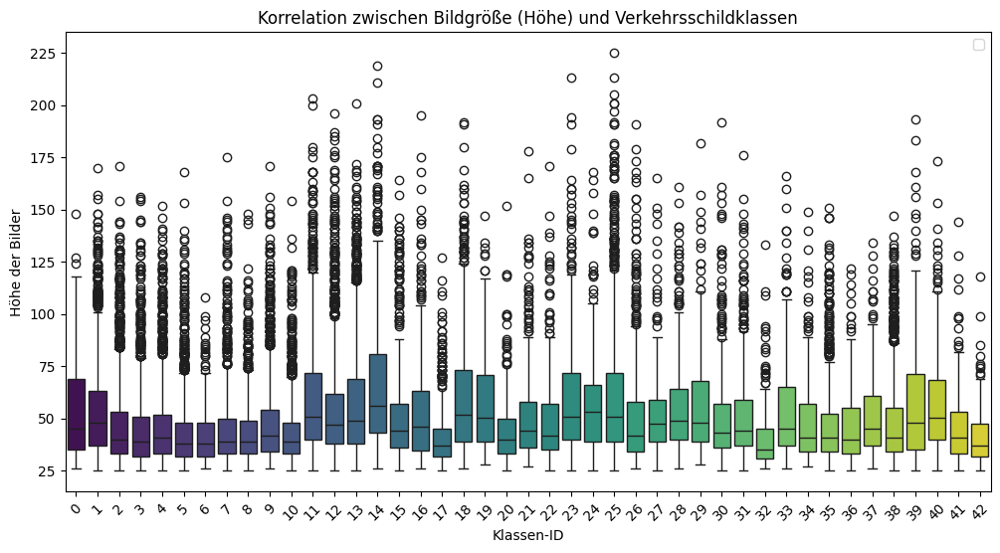

In [74]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='class', y='Height', data=data, palette='viridis')
plt.title('Korrelation zwischen Bildgröße (Höhe) und Verkehrsschildklassen')
plt.xlabel('Klassen-ID')
plt.ylabel('Höhe der Bilder')
plt.xticks(rotation=45)
plt.legend()
plt.show()


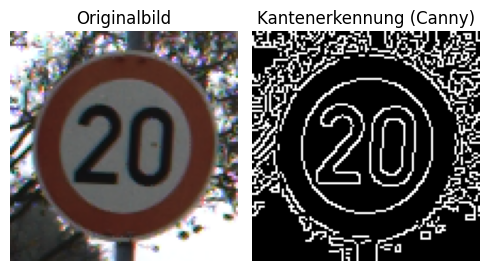

In [60]:
img = images[88]
edges = cv2.Canny(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY), 100, 200)  # Bild in Graustufen umwandeln

# Plot des Originalbilds und der Kanten
plt.figure(figsize=(5, 5))
plt.subplot(121)
plt.imshow(img)
plt.title('Originalbild')
plt.axis('off')

plt.subplot(122)
plt.imshow(edges, cmap='gray')
plt.title('Kantenerkennung (Canny)')
plt.axis('off')

plt.tight_layout()
plt.show()

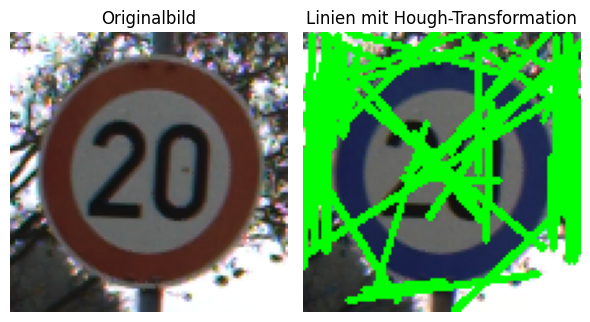

In [308]:
# Konvertiere das Bild in Graustufen
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Kantenerkennung mit dem Canny-Algorithmus
edges = cv2.Canny(gray, 50, 150, apertureSize=3)

# Hough-Transformation für Linien
lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=0, minLineLength=30, maxLineGap=10)

# Zeichne gefundene Linien auf das Bild
img_with_lines = img.copy()
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(img_with_lines, (x1, y1), (x2, y2), (0, 255, 0), 2)

# Plot des Originalbilds und der Linien
plt.figure(figsize=(6, 6))
plt.subplot(121)
plt.imshow(img)
plt.title('Originalbild')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(img_with_lines, cv2.COLOR_BGR2RGB))
plt.title('Linien mit Hough-Transformation')
plt.axis('off')

plt.tight_layout()
plt.show()

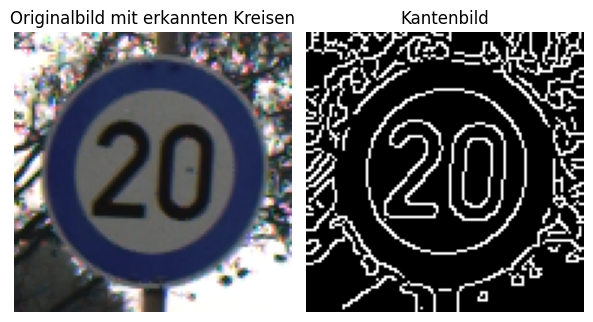

In [323]:
# Konvertiere das Bild in Graustufen
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Gaußscher Weichzeichner, um Rauschen zu reduzieren
blur = cv2.GaussianBlur(gray, (5, 5), 0)

# Canny-Kantenerkennung für die Kantenextraktion
edges = cv2.Canny(blur, 50, 150)

# Definiere den Kreisdetektor für die GHT
circle_detector = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1, minDist=20, param1=50, param2=30, minRadius=10, maxRadius=50)
# Überprüfe, ob Kreise gefunden wurden
if circle_detector is not None: 
    circle_detector = np.round(circle_detector[0, :]).astype("int")
    for (x, y, r) in circle_detector:
        # Konvertiere cv2.UMat zu einem Numpy-Array, um es für cv2.circle zu verwenden
        cv2.circle(np.array(img), (x, y), r, (0, 255, 0), 2)

# Plot des Originalbilds und der erkannten Kreise
plt.figure(figsize=(6, 6))
plt.subplot(121)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Konvertiere BGR zu RGB für die Anzeige mit Matplotlib
plt.title('Originalbild mit erkannten Kreisen')
plt.axis('off')

plt.subplot(122)
plt.imshow(edges, cmap='gray')
plt.title('Kantenbild')
plt.axis('off')

plt.tight_layout()
plt.show()

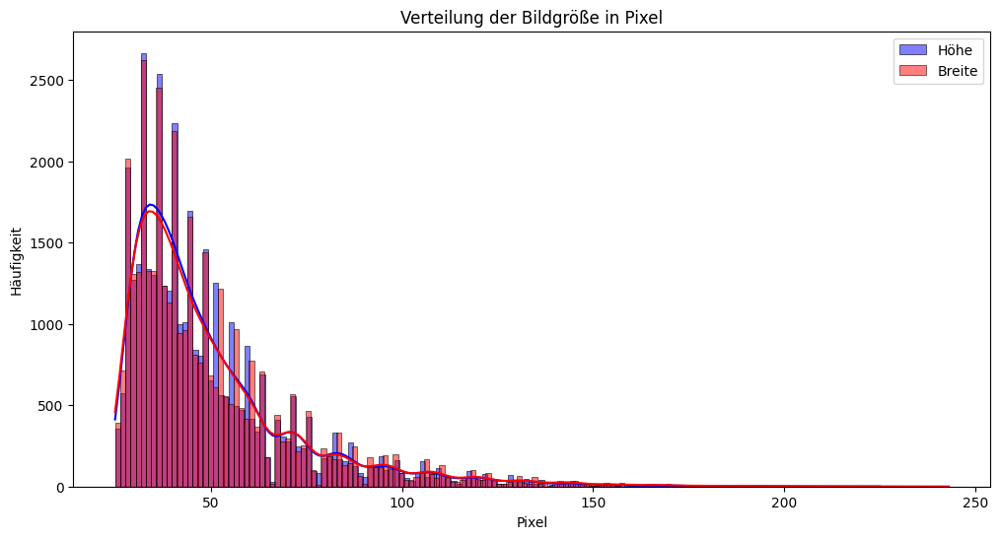

In [61]:
# Verteilung der Bildgrößen
plt.figure(figsize=(12, 6))
sns.histplot(df_train_shapes['Height'], kde=True, color='blue', label='Höhe')
sns.histplot(df_train_shapes['Width'], kde=True, color='red', label='Breite')
plt.legend()
plt.xlabel('Pixel')
plt.ylabel('Häufigkeit')
plt.title('Verteilung der Bildgröße in Pixel')
plt.show()

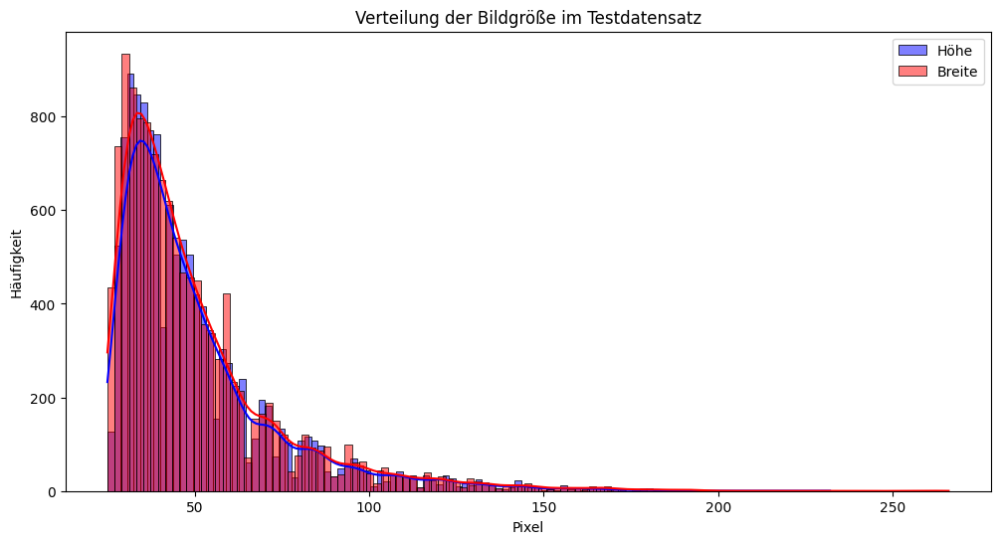

In [77]:
# Verteilung der Bildgrößen
plt.figure(figsize=(12, 6))
sns.histplot(df_test_shapes['Height'], kde=True, color='blue', label='Höhe')
sns.histplot(df_test_shapes['Width'], kde=True, color='red', label='Breite')
plt.legend()
plt.xlabel('Pixel')
plt.ylabel('Häufigkeit')
plt.title('Verteilung der Bildgröße im Testdatensatz')
plt.show()

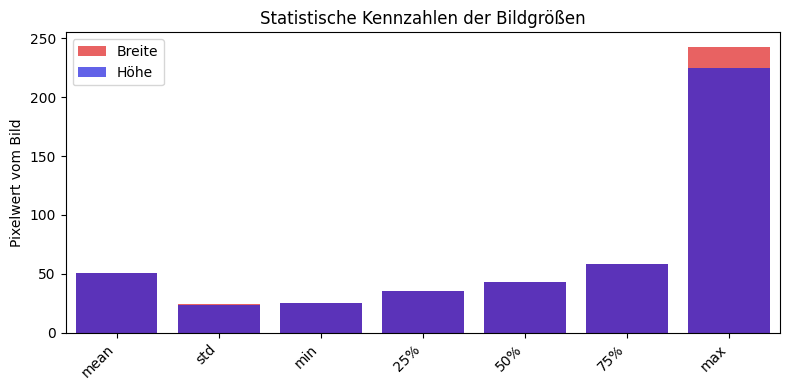

In [55]:
# Statistische Kennzahlen berechnen
stats = df_train_shapes.describe().drop('count')  # 'count' entfernen

# Plot
plt.figure(figsize=(8, 4))
sns.barplot(x=stats.index, y=stats['Width'], color='red',alpha=0.7, label='Breite')
sns.barplot(x=stats.index, y=stats['Height'], color='blue',alpha=0.7, label='Höhe')
plt.title('Statistische Kennzahlen der Bildgrößen')
plt.ylabel('Pixelwert vom Bild')
plt.xlabel('')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

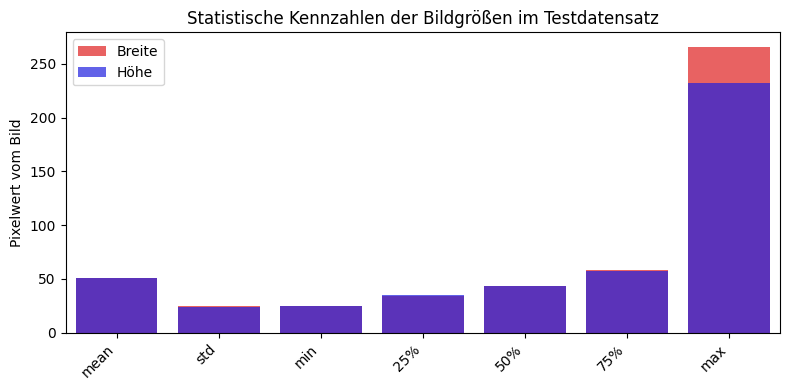

In [78]:
# Statistische Kennzahlen berechnen
#stats = df_test_shapes.describe().drop('count')  # 'count' entfernen

# Plot
plt.figure(figsize=(8, 4))
sns.barplot(x=stats.index, y=stats['Width'], color='red',alpha=0.7, label='Breite')
sns.barplot(x=stats.index, y=stats['Height'], color='blue',alpha=0.7, label='Höhe')
plt.title('Statistische Kennzahlen der Bildgrößen im Testdatensatz')
plt.ylabel('Pixelwert vom Bild')
plt.xlabel('')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

In [56]:
# Überprüfe die Vollständigkeit der Daten
missing_data = pd.Series([len(images), len(labels), len(image_shapes), len(rois), len(image_paths)], 
                         index=['images', 'labels', 'image_shapes', 'rois', 'image_paths'])
print("Anzahl der Einträge in den Daten:")
print(missing_data)

Anzahl der Einträge in den Daten:
images          39209
labels          39209
image_shapes    39209
rois            39209
image_paths     39209
dtype: int64


In [57]:
df_train_shapes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39209 entries, 0 to 39208
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype
---  ------    --------------  -----
 0   Height    39209 non-null  int64
 1   Width     39209 non-null  int64
 2   Channels  39209 non-null  int64
dtypes: int64(3)
memory usage: 919.1 KB


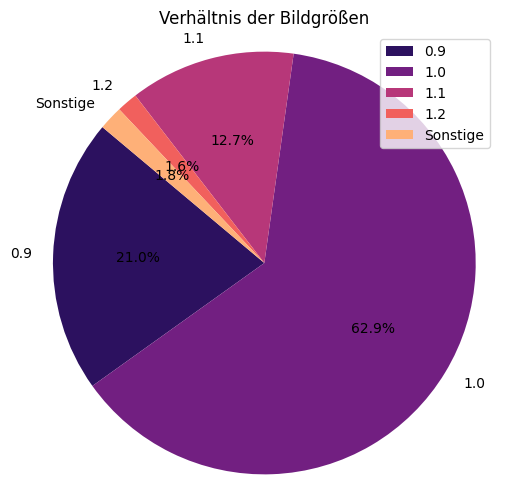

In [154]:
# Verhältnis der Bildgrößen in einem Piechart
image_size_ratios = df_train_shapes.apply(lambda x: x['Height'] / x['Width'], axis=1)
# Runde die Verhältnisse auf eine Dezimalstelle
rounded_size_ratios = image_size_ratios.round(1)
size_ratios_counts = rounded_size_ratios.value_counts().sort_index()

# Aggregiere seltene Verhältnisse in "Andere"
threshold = 0.01 * len(df_train_shapes)  # setze die Schwelle bei 1% der Gesamtbilder
size_ratios_counts_aggregated = size_ratios_counts.copy()
other_count = size_ratios_counts[size_ratios_counts < threshold].sum()
size_ratios_counts_aggregated = size_ratios_counts[size_ratios_counts >= threshold]
size_ratios_counts_aggregated['Sonstige'] = other_count

# Piechart
plt.figure(figsize=(6, 6))
plt.pie(size_ratios_counts_aggregated, labels=size_ratios_counts_aggregated.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('magma', len(size_ratios_counts_aggregated)))
plt.title('Verhältnis der Bildgrößen')
plt.legend(loc='upper right')
plt.axis('equal')
plt.show()

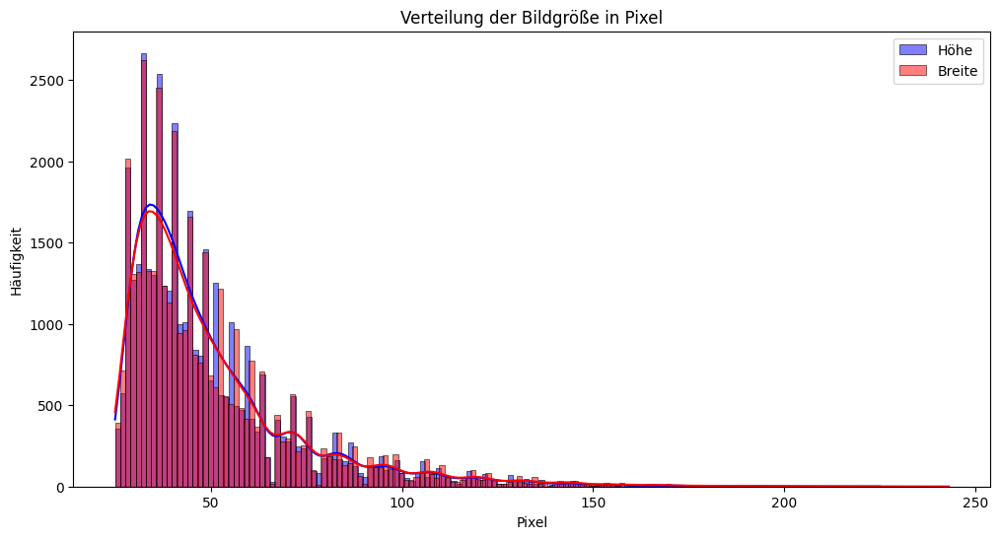

In [158]:
# Verteilung der Bildgrößen
plt.figure(figsize=(12, 6))
sns.histplot(df_train_shapes['Height'], kde=True, color='blue', label='Höhe')
sns.histplot(df_train_shapes['Width'], kde=True, color='red', label='Breite')
plt.legend()
plt.xlabel('Pixel')
plt.ylabel('Häufigkeit')
plt.title('Verteilung der Bildgröße in Pixel')
plt.show()

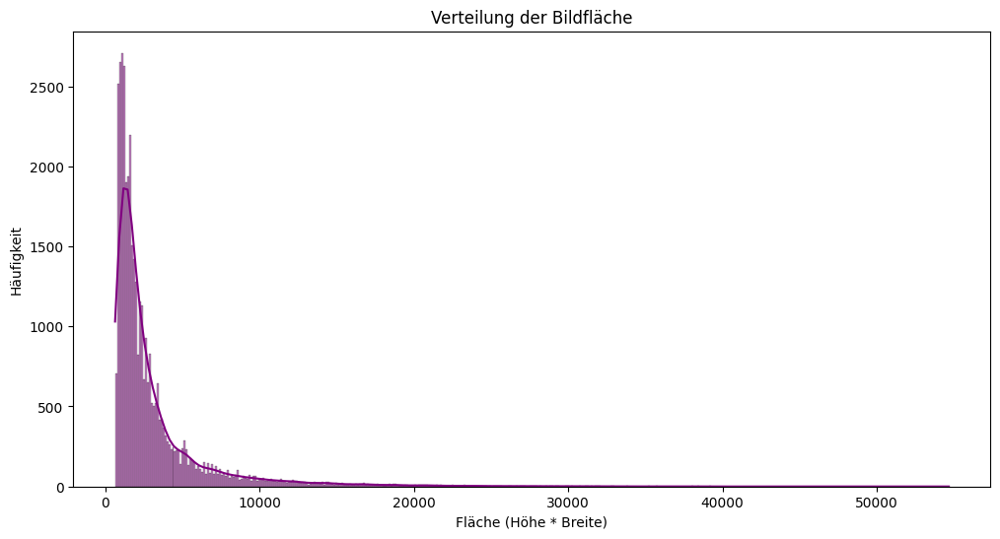

In [160]:
# Verteilung der Bildflächen
df_train_shapes['Area'] = df_train_shapes['Height'] * df_train_shapes['Width']
plt.figure(figsize=(12, 6))
sns.histplot(df_train_shapes['Area'], kde=True, color='purple')
plt.title('Verteilung der Bildfläche')
plt.xlabel('Fläche (Höhe * Breite)')
plt.ylabel('Häufigkeit')
plt.show()

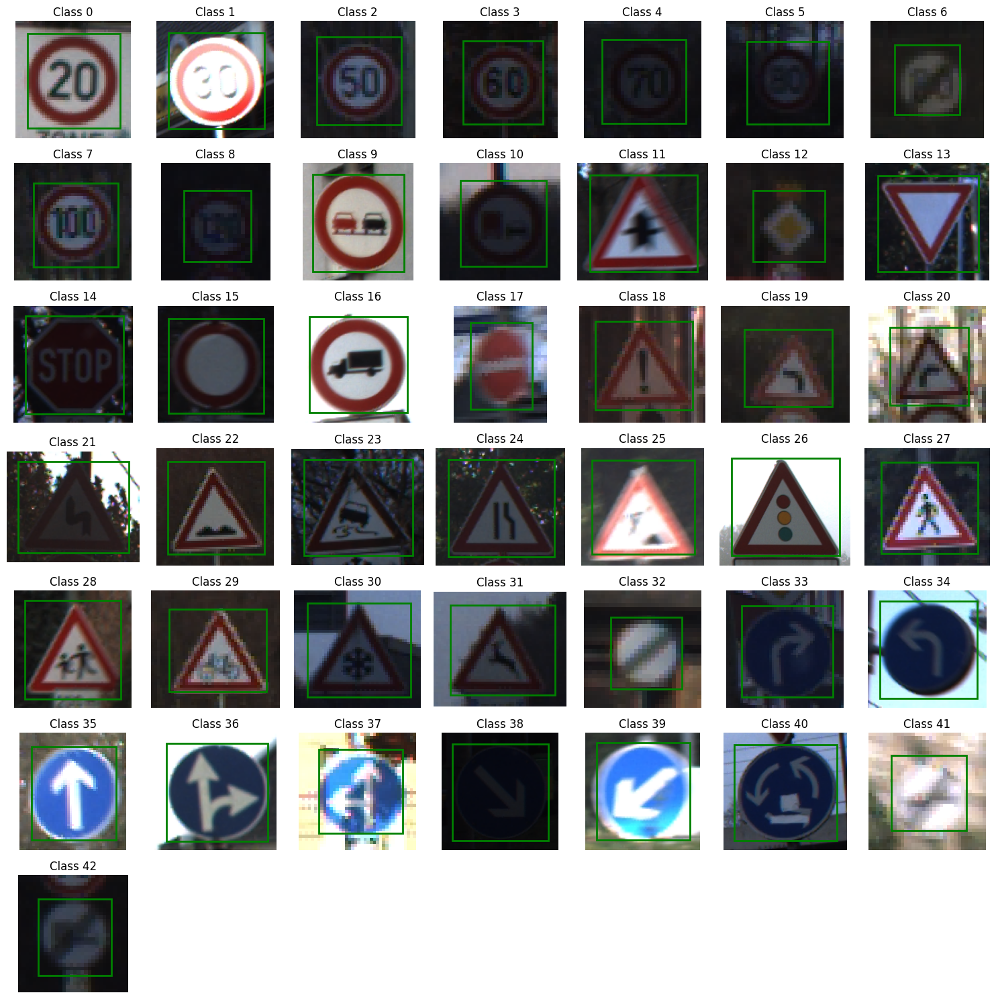

In [31]:
# Beispielbilder jeder Klasse mit ROI
plt.figure(figsize=(15, 15))
for class_id in range(num_classes):
    idxs = np.where(np.array(labels) == class_id)[0]
    idx = np.random.choice(idxs)
    img = images[idx]
    roi = rois[idx]
    plt.subplot(7, 7, class_id + 1)
    plt.imshow(img)
    plt.gca().add_patch(plt.Rectangle((roi[0], roi[1]), roi[2] - roi[0], roi[3] - roi[1], edgecolor='green', facecolor='none', linewidth=2))
    plt.axis('off')
    plt.title(f'Class {class_id}')
plt.tight_layout()
plt.show()

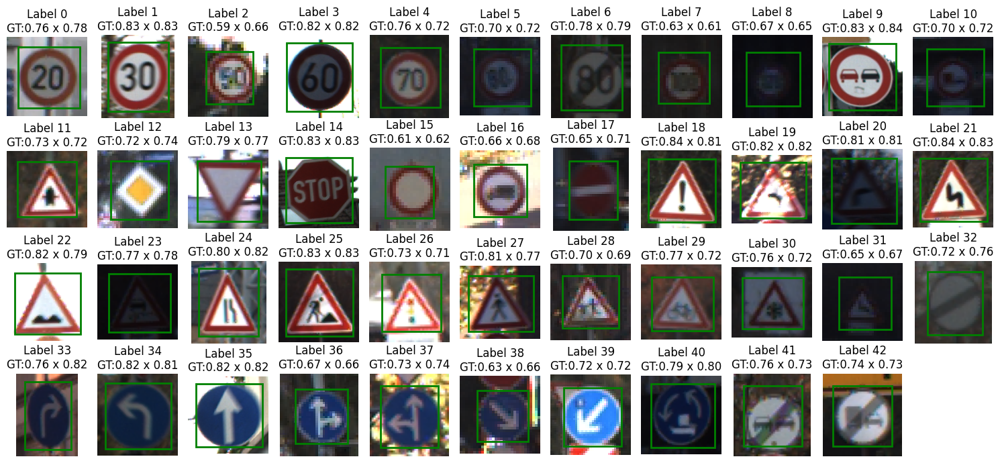

In [135]:
# Beispielbilder jeder Klasse mit ROI und relativer Größe der Bounding Box
plt.figure(figsize=(15, 12))
for class_id in range(num_classes):
    idxs = np.where(np.array(labels) == class_id)[0]
    idx = np.random.choice(idxs)
    img = images[idx]
    roi = rois[idx]
    
    # Berechne die relative Größe der Bounding Box zum gesamten Bild
    img_height, img_width = img.shape[:2]
    roi_width = roi[2] - roi[0]
    roi_height = roi[3] - roi[1]
    
    # Relative Größe berechnen
    relative_roi_width = roi_width / img_width
    relative_roi_height = roi_height / img_height

    plt.subplot(7, 11, class_id + 1)
    plt.imshow(img)
    plt.gca().add_patch(plt.Rectangle((roi[0], roi[1]), roi_width, roi_height, edgecolor='green', facecolor='none', linewidth=2))
    plt.axis('off')
    plt.title(f'Label {class_id}\nGT:{relative_roi_width:.2f} x {relative_roi_height:.2f}')

plt.tight_layout()
plt.show()

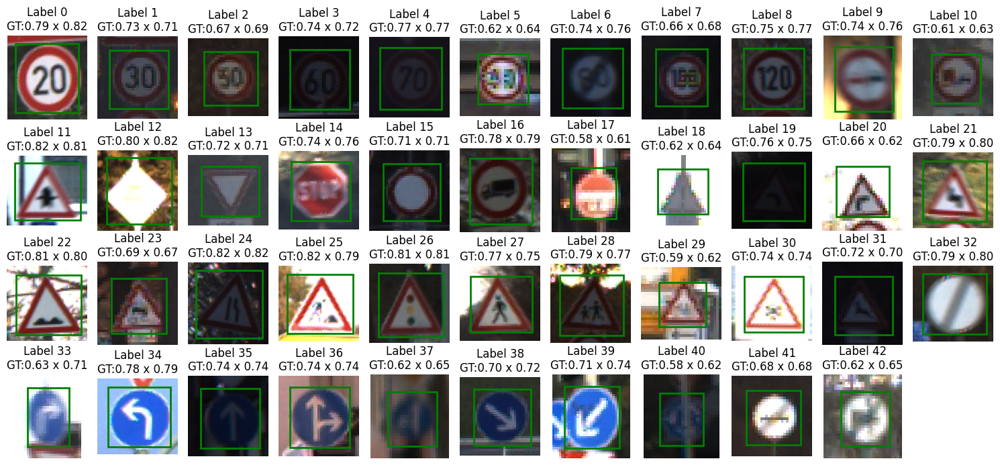

In [134]:
# Erstelle einen DataFrame mit den relevanten Informationen
data = {
    'Label': df_test['Label'],
    'Image': df_test['Image'],
    'ROI': df_test['ROI'],
    'Height': df_test_shapes['Height'],
    'Width': df_test_shapes['Width'],
}
df_test_plot = pd.DataFrame(data)

plt.figure(figsize=(15, 12))

for class_id in range(num_classes):
    class_df = df_test_plot[df_test_plot['Label'] == class_id]
    sample = class_df.sample(1).iloc[0]  # Wähle ein zufälliges Beispiel dieser Klasse aus
    img = sample['Image']
    roi = sample['ROI']
    
    # Berechne die relative Größe der Bounding Box zum gesamten Bild
    img_height = sample['Height']
    img_width = sample['Width']
    roi_width = roi[2] - roi[0]
    roi_height = roi[3] - roi[1]
    
    # Relative Größe berechnen
    relative_roi_width = roi_width / img_width
    relative_roi_height = roi_height / img_height

    plt.subplot(7, 11, class_id + 1)
    
    # Wenn die Farben invertiert erscheinen, tausche die Farbkanäle
    if img.shape[-1] == 3:  # Prüfe, ob das Bild 3 Kanäle hat (RGB/BGR)
        img = img[:, :, ::-1]  # Tausche die Kanäle von BGR zu RGB

    plt.imshow(img)
    plt.gca().add_patch(plt.Rectangle((roi[0], roi[1]), roi_width, roi_height, edgecolor='green', facecolor='none', linewidth=2))
    plt.axis('off')
    plt.title(f'Label {class_id}\nGT:{relative_roi_width:.2f} x {relative_roi_height:.2f}')

plt.tight_layout()
plt.show()

In [193]:
def load_brightness_values(image_paths):
    brightness_values = []
    for path in image_paths:
        img = cv2.imread(path)
        if img is not None:
            # Berechne die durchschnittliche Helligkeit des Bildes
            brightness = np.mean(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY))
            brightness_values.append(brightness)
    return brightness_values

# Helligkeitswerte laden
brightness_values = load_brightness_values(image_paths)

In [194]:
brightness_normalized = [v / 255.0 for v in brightness_values]

In [205]:
def plot_images_by_brightness(image_paths):
    
    # Sortiere die Bilder nach Helligkeit
    sorted_images = sorted(zip(image_paths, brightness_normalized), key=lambda x: x[1])

    # Wähle ein Bild aus dem unteren, mittleren und oberen Helligkeitsbereich
    low_brightness_image = sorted_images[int(0.05 * len(sorted_images))][0]
    mid_brightness_image = sorted_images[int(0.5 * len(sorted_images))][0]
    high_brightness_image = sorted_images[int(0.95 * len(sorted_images))][0]

    # Lade und zeige die Bilder
    low_img = cv2.imread(low_brightness_image)
    mid_img = cv2.imread(mid_brightness_image)
    high_img = cv2.imread(high_brightness_image)

    # Konvertiere die Bilder von BGR zu RGB
    low_img_rgb = cv2.cvtColor(low_img, cv2.COLOR_BGR2RGB)
    mid_img_rgb = cv2.cvtColor(mid_img, cv2.COLOR_BGR2RGB)
    high_img_rgb = cv2.cvtColor(high_img, cv2.COLOR_BGR2RGB)

    # Plot
    plt.figure(figsize=(6, 6))

    plt.subplot(3, 1, 1)
    plt.imshow(low_img_rgb)
    plt.title('Niedrige Helligkeit')
    plt.axis('off')

    plt.subplot(3, 1, 2)
    plt.imshow(mid_img_rgb)
    plt.title('Normale Helligkeit')
    plt.axis('off')

    plt.subplot(3, 1, 3)
    plt.imshow(high_img_rgb)
    plt.title('Hohe Helligkeit')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

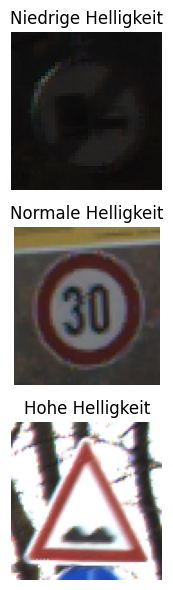

In [206]:
plot_images_by_brightness(image_paths)

C:\Users\Alexej\AppData\Local\Temp\ipykernel_15308\3504248974.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=brightness_normalized, palette='viridis', edgecolor='black', kde=True)


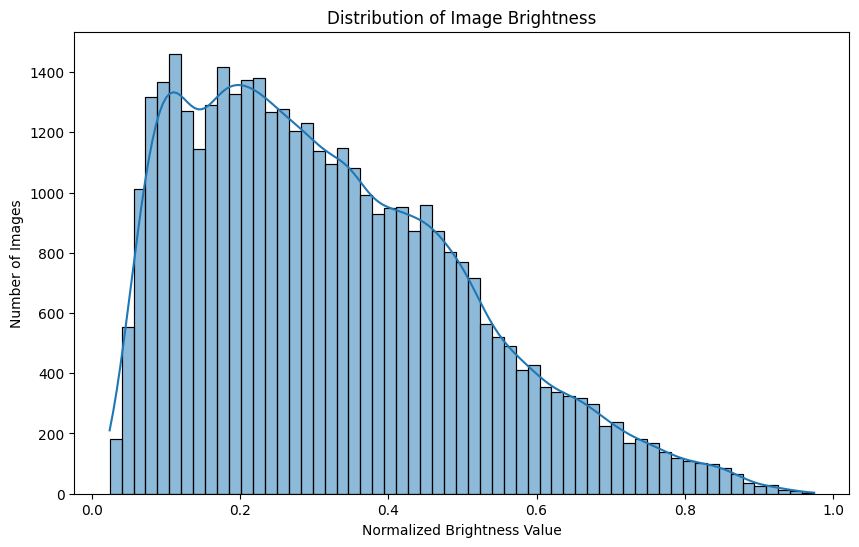

In [35]:
plt.figure(figsize=(10, 6))
sns.histplot(x=brightness_normalized, palette='viridis', edgecolor='black', kde=True)
plt.xlabel('Normalized Brightness Value')
plt.ylabel('Number of Images')
plt.title('Distribution of Image Brightness')
plt.show()

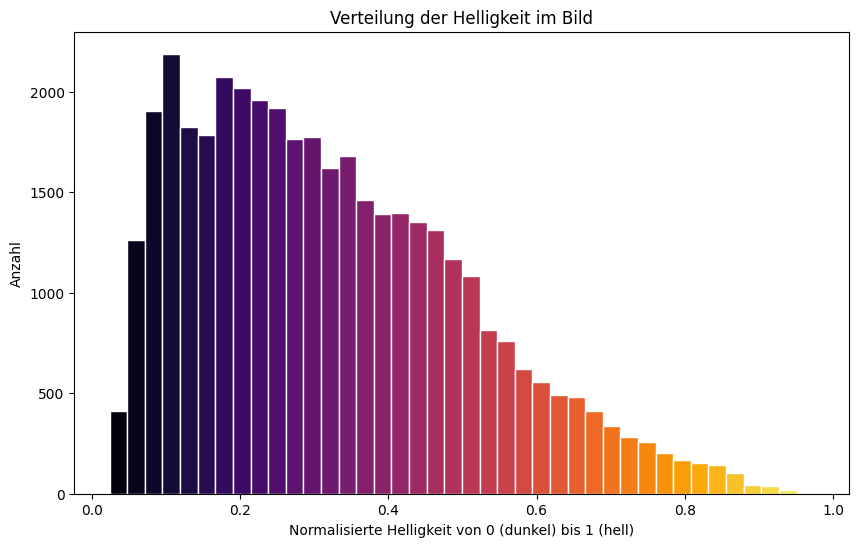

In [67]:
# Histogramm mit angepassten Farben plotten
plt.figure(figsize=(10, 6))

# Histogramm manuell erstellen
counts, bins, patches = plt.hist(brightness_normalized, bins = 40, edgecolor = 'white')

# Farben für die Balken basierend auf der Helligkeit zuweisen
norm = plt.Normalize(vmin=0, vmax=1)
#sm = plt.cm.ScalarMappable(cmap='gray', norm=norm)
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)


for patch, value in zip(patches, bins):
    color = sm.to_rgba(value)
    patch.set_facecolor(color)


# Achsenbeschriftungen und Titel hinzufügen
plt.xlabel('Normalisierte Helligkeit von 0 (dunkel) bis 1 (hell)')
plt.ylabel('Anzahl')
plt.title('Verteilung der Helligkeit im Bild')

# Plot anzeigen
plt.show()

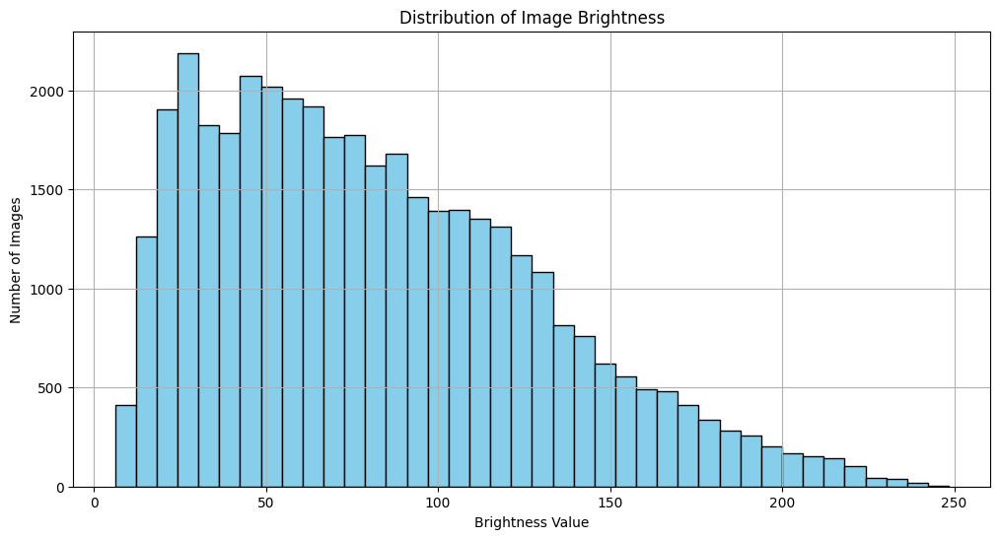

In [40]:
plt.figure(figsize=(12, 6))
plt.hist(brightness_values, bins=40, color='skyblue', edgecolor='black')
plt.xlabel('Brightness Value')
plt.ylabel('Number of Images')
plt.title('Distribution of Image Brightness')
plt.grid(True)
plt.show()

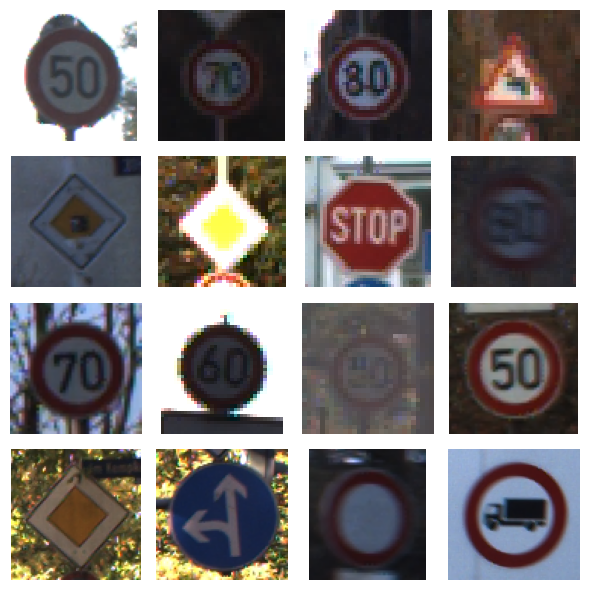

In [45]:
num_images = len(images)

num_rows = 4
num_cols = 4

random_indices = np.random.choice(num_images, size=num_rows * num_cols, replace=False)

# Erstelle einen Subplot für jedes Bild
fig, axes = plt.subplots(num_rows, num_cols, figsize=(6, 6))

# Fülle jeden Subplot mit einem zufälligen Bild
for i, ax in enumerate(axes.flat):
    image_index = random_indices[i]
    ax.imshow(images[image_index])
    ax.axis('off')  # Deaktiviere die Achsenbeschriftung

plt.tight_layout()  
plt.show()

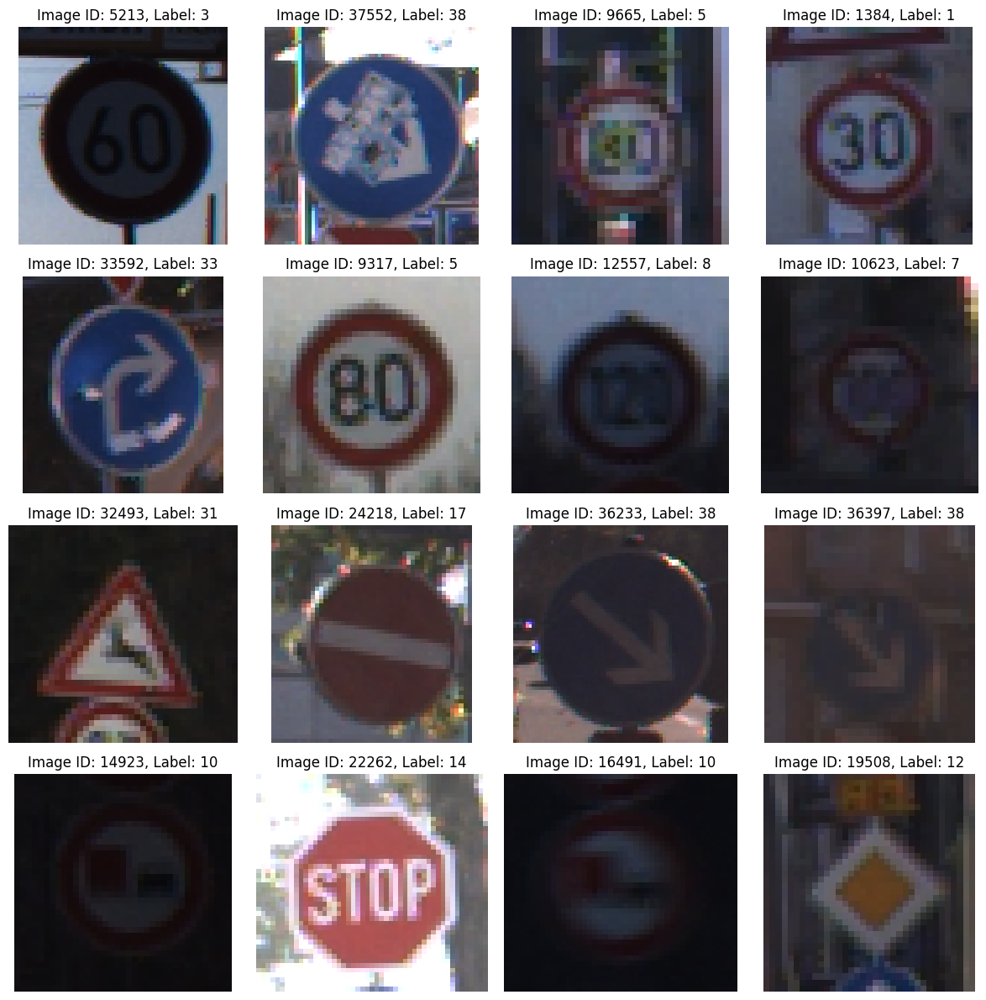

In [7]:
num_images = len(images)
num_rows = 4
num_cols = 4
random_indices = np.random.choice(num_images, size=num_rows * num_cols, replace=False)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 12))

for i, ax in enumerate(axes.flat):
    image_index = random_indices[i]
    ax.imshow(images[image_index])
    ax.axis('off')  
    ax.set_title(f"Image ID: {image_index}, Label: {labels[image_index]}")

plt.tight_layout()  
plt.show()

In [ ]:
import cv2
import numpy as np

# Laden des vortrainierten YOLO-Modells und der Konfigurationsdateien
net = cv2.dnn.readNet('yolov3.weights', 'yolov3.cfg')
layer_names = net.getLayerNames()
output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]

def preprocess_image(image, target_size):
    """Resize and pad image to target size."""
    h, w = image.shape[:2]
    scale = target_size / max(h, w)
    nh, nw = int(h * scale), int(w * scale)
    image_resized = cv2.resize(image, (nw, nh))
    new_image = np.full((target_size, target_size, 3), 128)
    new_image[(target_size - nh) // 2:(target_size - nh) // 2 + nh, (target_size - nw) // 2:(target_size - nw) // 2 + nw] = image_resized
    return new_image, scale, (target_size - nh) // 2, (target_size - nw) // 2

def postprocess_output(outputs, scale, pad_x, pad_y, original_shape):
    """Process YOLO outputs and map them back to the original image size."""
    boxes, confidences, class_ids = [], [], []
    h, w = original_shape[:2]
    for out in outputs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                center_x, center_y = int(detection[0] * 416), int(detection[1] * 416)
                width, height = int(detection[2] * 416), int(detection[3] * 416)
                left = int(center_x - width / 2) - pad_x
                top = int(center_y - height / 2) - pad_y
                left = int(left / scale)
                top = int(top / scale)
                width = int(width / scale)
                height = int(height / scale)
                boxes.append([left, top, width, height])
                confidences.append(float(confidence))
                class_ids.append(class_id)
    return boxes, confidences, class_ids

# Videostream einrichten
cap = cv2.VideoCapture('video.mp4')
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    blob, scale, pad_x, pad_y = preprocess_image(frame, 416)
    net.setInput(blob)
    outputs = net.forward(output_layers)
    boxes, confidences, class_ids = postprocess_output(outputs, scale, pad_x, pad_y, frame.shape)

    # Zeichnen der Bounding Boxes auf dem Original-Frame
    for box in boxes:
        left, top, width, height = box
        cv2.rectangle(frame, (left, top), (left + width, top + height), (0, 255, 0), 2)

    cv2.imshow('Frame', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()


In [9]:
!pip uninstall opencv-python-headless

^C


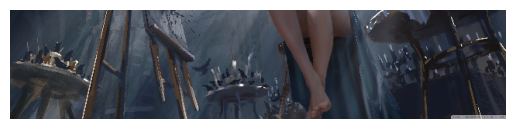

In [36]:
import cv2
import matplotlib.pyplot as plt

def resize_and_crop_image(image_path, target_size):
    # Bild laden
    image = cv2.imread(image_path)
    
    # Skalierung auf die maximale Größe unter Beibehaltung des Seitenverhältnisses
    h, w = image.shape[:2]
    ratio = float(target_size) / max(h, w)
    new_h, new_w = int(h * ratio), int(w * ratio)
    resized_image = cv2.resize(image, (new_w, new_h))

    # Zuschnitt, um ein quadratisches Bild zu erhalten
    dh = (new_h - target_size) // 2
    dw = (new_w - target_size) // 2
    cropped_image = resized_image[dh:dh+target_size, dw:dw+target_size]

    return cropped_image

# Bildpfad und Zielgröße definieren
image_path = 'fantasy_japanese_girl_art-wallpaper-3554x1999.jpg'  # Passe den Pfad zu deinem Bild an
target_size = 640

# Funktion aufrufen, um das Bild zu skalieren und zu zuschneiden
result_image = resize_and_crop_image(image_path, target_size)

# Ergebnis anzeigen
plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

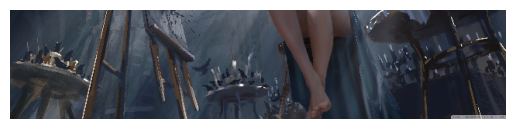

In [37]:
import cv2
import matplotlib.pyplot as plt

def resize_and_crop_image(image_path, target_size):
    # Bild laden
    image = cv2.imread(image_path)
    
    # Skalierung auf die maximale Größe unter Beibehaltung des Seitenverhältnisses
    h, w = image.shape[:2]
    ratio = float(target_size) / max(h, w)
    new_h, new_w = int(h * ratio), int(w * ratio)
    resized_image = cv2.resize(image, (new_w, new_h))

    # Zuschnitt, um ein quadratisches Bild zu erhalten
    dh = (new_h - target_size) // 2
    dw = (new_w - target_size) // 2
    cropped_image = resized_image[dh:dh+target_size, dw:dw+target_size]

    return cropped_image

# Bildpfad und Zielgröße definieren
image_path = 'fantasy_japanese_girl_art-wallpaper-3554x1999.jpg'  # Passe den Pfad zu deinem Bild an
target_size = 640

# Funktion aufrufen, um das Bild zu skalieren und zu zuschneiden
result_image = resize_and_crop_image(image_path, target_size)

# Ergebnis anzeigen
plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

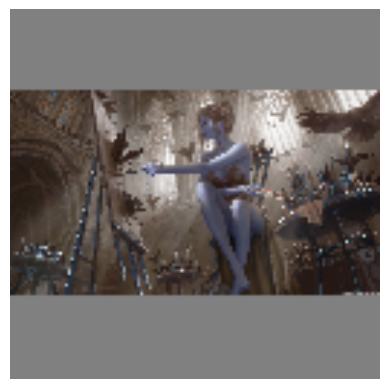

In [64]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def preprocess_image(image, target_size):
    """Resize and pad image to target size."""
    h, w = image.shape[:2]
    scale = target_size / max(h, w)
    nh, nw = int(h * scale), int(w * scale)
    image_resized = cv2.resize(image, (nw, nh))
    new_image = np.full((target_size, target_size, 3), 128)
    new_image[(target_size - nh) // 2:(target_size - nh) // 2 + nh, (target_size - nw) // 2:(target_size - nw) // 2 + nw] = image_resized
    return new_image, scale, (target_size - nh) // 2, (target_size - nw) // 2

# Bildpfad definieren
image_path = 'fantasy_japanese_girl_art-wallpaper-3554x1999.jpg'  # Passe den Pfad zu deinem Bild an
target_size = 128

# Bild laden
frame = cv2.imread(image_path)

# Bild vorverarbeiten
blob, scale, pad_x, pad_y = preprocess_image(frame, target_size)

# Ergebnis anzeigen
plt.imshow(blob, interpolation='bilinear')
plt.axis('off')
plt.show()

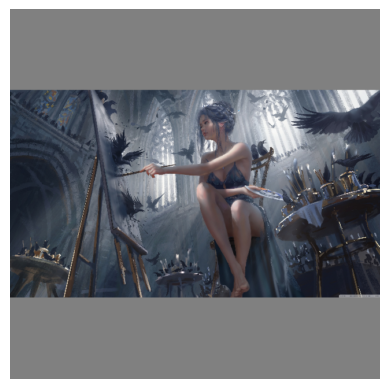

Vorverarbeitete Bildgröße: (640, 640, 3)


In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def preprocess_image(image, target_size):
    """Resize and pad image to target size."""
    h, w = image.shape[:2]
    scale = target_size / max(h, w)
    nh, nw = int(h * scale), int(w * scale)
    image_resized = cv2.resize(image, (nw, nh))

    # Padding to target size
    new_image = np.full((target_size, target_size, 3), 128, dtype=np.uint8)
    pad_y = (target_size - nh) // 2
    pad_x = (target_size - nw) // 2
    new_image[pad_y:pad_y + nh, pad_x:pad_x + nw] = image_resized
    
    return new_image, scale, pad_x, pad_y

# Bildpfad definieren
image_path = 'fantasy_japanese_girl_art-wallpaper-3554x1999.jpg'  # Passe den Pfad zu deinem Bild an
target_size = 640

# Bild laden
frame = cv2.imread(image_path)

# Bild vorverarbeiten
blob, scale, pad_x, pad_y = preprocess_image(frame, target_size)

# Vorverarbeitetes Bild anzeigen mit korrekten Farben
plt.imshow(cv2.cvtColor(blob, cv2.COLOR_BGR2RGB), interpolation='bilinear')
plt.axis('off')
plt.show()

print("Vorverarbeitete Bildgröße:", blob.shape)

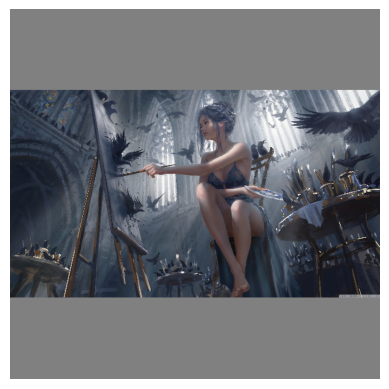

Original Bildgröße: (1999, 3554, 3)
Vorverarbeitete Bildgröße: (640, 640, 3)


In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def preprocess_image(image, target_size):
    """Resize and pad image to target size."""
    h, w = image.shape[:2]
    scale = target_size / max(h, w)
    nh, nw = int(h * scale), int(w * scale)
    image_resized = cv2.resize(image, (nw, nh))

    # Padding to target size
    new_image = np.full((target_size, target_size, 3), 128, dtype=np.uint8)
    pad_y = (target_size - nh) // 2
    pad_x = (target_size - nw) // 2
    new_image[pad_y:pad_y + nh, pad_x:pad_x + nw] = image_resized
    
    return new_image, scale, pad_x, pad_y

# Bildpfad definieren
image_path = 'fantasy_japanese_girl_art-wallpaper-3554x1999.jpg'  # Passe den Pfad zu deinem Bild an
target_size = 640

# Bild laden
frame = cv2.imread(image_path)

# Bild vorverarbeiten
blob, scale, pad_x, pad_y = preprocess_image(frame, target_size)

# Vorverarbeitetes Bild anzeigen mit korrekten Farben
plt.imshow(cv2.cvtColor(blob, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Original- und vorverarbeitete Bildgröße ausgeben
print("Original Bildgröße:", frame.shape)
print("Vorverarbeitete Bildgröße:", blob.shape)


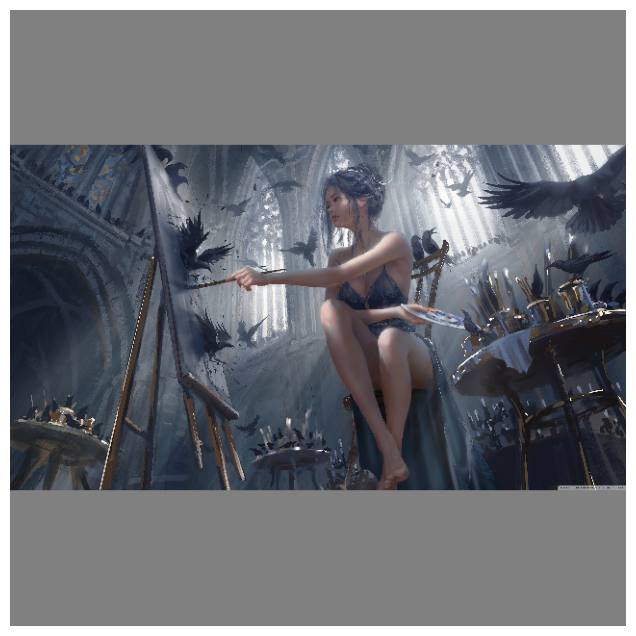

Original Bildgröße: (1999, 3554, 3)
Vorverarbeitete Bildgröße: (640, 640, 3)


In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

interpolation_methods = {
    cv2.INTER_NEAREST: 'INTER_NEAREST',
    cv2.INTER_LINEAR: 'INTER_LINEAR',
    cv2.INTER_CUBIC: 'INTER_CUBIC',
    cv2.INTER_AREA: 'INTER_AREA',
    cv2.INTER_LANCZOS4: 'INTER_LANCZOS4'
}

def preprocess_image(image, target_size, interp):
    """Resize and pad image to target size."""
    h, w = image.shape[:2]
    scale = target_size / max(h, w)
    nh, nw = int(h * scale), int(w * scale)
    image_resized = cv2.resize(image, (nw, nh), interpolation=interp)

    # Padding to target size
    new_image = np.full((target_size, target_size, 3), 128, dtype=np.uint8)
    pad_y = (target_size - nh) // 2
    pad_x = (target_size - nw) // 2
    new_image[pad_y:pad_y + nh, pad_x:pad_x + nw] = image_resized
    
    return new_image, scale, pad_x, pad_y


image_path = 'fantasy_japanese_girl_art-wallpaper-3554x1999.jpg' 
target_size = 640
interpolation = cv2.INTER_LANCZOS4

# Interpolationsmethode als String ausgeben
interpolation_name = interpolation_methods.get(interpolation, 'UNKNOWN')


frame = cv2.imread(image_path)
blob, scale, pad_x, pad_y = preprocess_image(frame, target_size, interpolation)

# Vorverarbeitetes Bild speichern
output_path = '{}.jpg'.format(interpolation_name)
cv2.imwrite(output_path, blob)

plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(blob, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


# Original- und vorverarbeitete Bildgröße ausgeben
print("Original Bildgröße:", frame.shape)
print("Vorverarbeitete Bildgröße:", blob.shape)


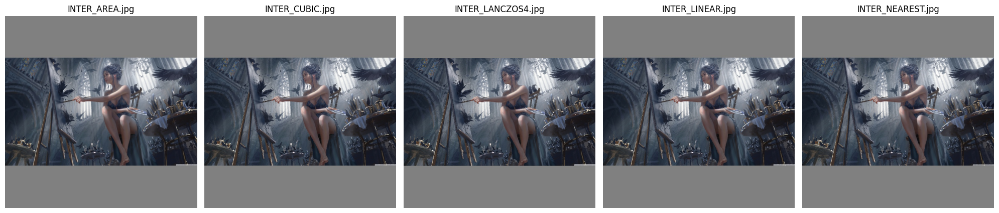

In [40]:
import matplotlib.pyplot as plt
import cv2

# Dateinamen der Bilder
image_files = ['INTER_AREA.jpg', 'INTER_CUBIC.jpg', 'INTER_LANCZOS4.jpg', 'INTER_LINEAR.jpg', 'INTER_NEAREST.jpg']

# Plot erstellen
fig, axes = plt.subplots(1, 5, figsize=(20, 20))

# Für jedes Bild den Plot erstellen und den Dateinamen als Überschrift setzen
for i, image_file in enumerate(image_files):
    # Bild laden
    image = cv2.imread(image_file)
    # Bild anzeigen
    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i].set_title(image_file)  # Dateinamen als Überschrift setzen
    axes[i].axis('off')

# Plot anzeigen
plt.tight_layout()
plt.show()

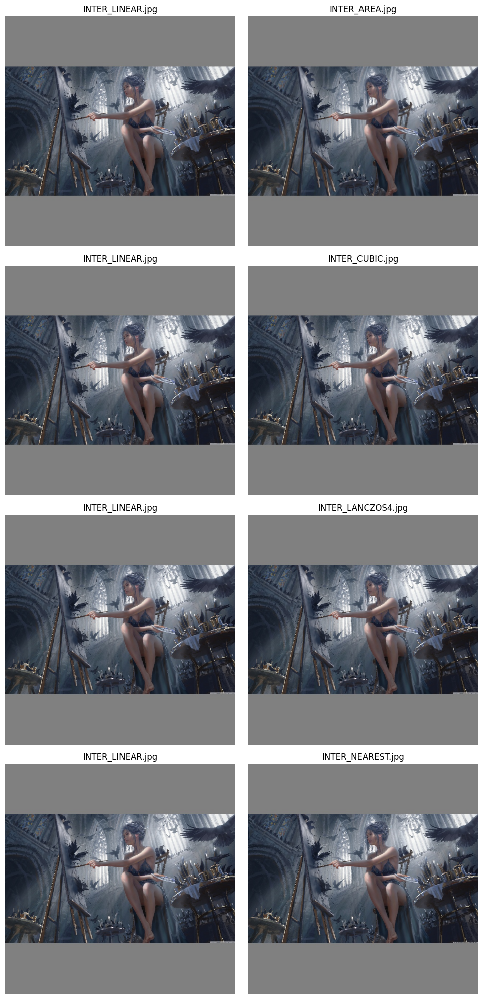

In [51]:


image_files = ['INTER_LINEAR.jpg', 'INTER_LINEAR.jpg', 'INTER_LINEAR.jpg', 'INTER_LINEAR.jpg', 'INTER_AREA.jpg', 'INTER_CUBIC.jpg', 'INTER_LANCZOS4.jpg', 'INTER_NEAREST.jpg']

# Plot erstellen
fig, axes = plt.subplots(4, 2, figsize=(10, 20))

# Für jedes Bild den Plot erstellen und den Dateinamen als Überschrift setzen
for i, image_file in enumerate(image_files):
    # Bild laden
    image = cv2.imread(image_file)
    # Bild anzeigen
    axes[i % 4, i // 4].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i % 4, i // 4].set_title(image_file)  # Dateinamen als Überschrift setzen
    axes[i % 4, i // 4].axis('off')

# Plot anzeigen
plt.tight_layout()
plt.show()